look at the utils in `gns-jax-temp`

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [3]:
import bisect 
from torch.utils.data import Dataset
import h5py
import numpy as np
import json
import matplotlib.pyplot as plt
from jax import vmap
from jax_md import space
import jax.numpy as jnp

/home/atoshev/code/sph-dataset-jax/venv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import os.path as osp
from typing import Callable, Optional

class H5Dataset(Dataset):
    """Dataset for loading HDF5 simulation trajectories.

    Reference on parallel loading of h5 samples see:
    https://github.com/pytorch/pytorch/issues/11929

    Implementation inspired by:
    https://github.com/Open-Catalyst-Project/ocp/blob/main/ocpmodels/datasets/lmdb_dataset.py
    """

    def __init__(
        self,
        split: str,
        dataset_path: str,
        name: Optional[str] = None,
        input_seq_length: int = 6,
        split_valid_traj_into_n: int = 1,
        is_rollout: bool = False,
        nl_backend: str = "jaxmd_vmap",
        external_force_fn: Optional[Callable] = None,
    ):
        """Initialize the dataset. If the dataset is not present, it is downloaded.

        Args:
            split: "train", "valid", or "test"
            dataset_path: Path to the dataset
            name: Name of the dataset. If None, it is inferred from the path.
            input_seq_length: Length of the input sequence. The number of historic
                velocities is input_seq_length - 1. And during training, the returned
                number of past positions is input_seq_length + 1, to compute target
                acceleration.
            split_valid_traj_into_n: Number of splits per validation trajectory. If the
                length of each trajectory is 1000, we want to compute a 20-step MSE, and
                intput_seq_length=6, then we should split the trajectory into
                split_valid_traj_into_n = 1000 // (20 + input_seq_length) chunks.
            is_rollout: Whether to return trajectories (valid) or subsequences (train)
            nl_backend: Which backend to use for the neighbor list
            external_force_fn: Function that returns the position-wise external force
        """
        if not osp.exists(dataset_path):
            name, dataset_path = self.download(name, dataset_path)

        assert split in ["train", "valid", "test"]

        self.dataset_path = dataset_path
        self.file_path = osp.join(dataset_path, split + ".h5")
        self.input_seq_length = input_seq_length
        self.split_valid_traj_into_n = split_valid_traj_into_n
        self.nl_backend = nl_backend

        self.external_force_fn = external_force_fn

        # load metadata
        with open(osp.join(dataset_path, "metadata.json"), "r") as f:
            self.metadata = json.loads(f.read())

        self.db_hdf5 = None

        self.name = name

        with h5py.File(self.file_path, "r") as f:
            self.traj_keys = list(f.keys())

            self.sequence_length = f["00000/position"].shape[0]

        # subsequence is used to split one long validation trajectory into multiple
        self.subsequence_length = self.sequence_length // split_valid_traj_into_n

        if is_rollout:
            self.getter = self.get_trajectory
            self.num_samples = split_valid_traj_into_n * len(self.traj_keys)
        else:
            samples_per_traj = self.sequence_length - self.input_seq_length - 1
            keylens = jnp.array([samples_per_traj for _ in range(len(self.traj_keys))])
            self._keylen_cumulative = jnp.cumsum(keylens).tolist()
            self.num_samples = sum(keylens)

            self.getter = self.get_window

    def _open_hdf5(self) -> h5py.File:
        if self.db_hdf5 is None:
            return h5py.File(self.file_path, "r")
        else:
            return self.db_hdf5

    def _matscipy_pad(self, pos_input, particle_type):
        padding_size = self.metadata["num_particles_max"] - pos_input.shape[0]
        pos_input = np.pad(
            pos_input,
            ((0, padding_size), (0, 0), (0, 0)),
            mode="constant",
            constant_values=0.0,
        )
        particle_type = np.pad(
            particle_type,
            (0, padding_size),
            mode="constant",
            constant_values=-1,
        )
        return pos_input, particle_type

    def get_trajectory(self, idx: int):
        """Get a (full) trajectory and index idx."""
        # open the database file
        self.db_hdf5 = self._open_hdf5()

        if self.split_valid_traj_into_n > 1:
            traj_idx = idx // self.split_valid_traj_into_n
            slice_from = (idx % self.split_valid_traj_into_n) * self.subsequence_length
            slice_to = slice_from + self.subsequence_length
        else:
            traj_idx = idx
            slice_from = 0
            slice_to = self.sequence_length

        # get a pointer to the trajectory. That is not yet the real trajectory.
        traj = self.db_hdf5[f"{self.traj_keys[traj_idx]}"]
        # get a pointer to the positions of the traj. Still nothing in memory.
        traj_pos = traj["position"]
        # load and transpose the trajectory
        pos_input = traj_pos[slice_from:slice_to].transpose((1, 0, 2))

        particle_type = traj["particle_type"][:]

        if self.nl_backend == "matscipy":
            pos_input, particle_type = self._matscipy_pad(pos_input, particle_type)

        return pos_input, particle_type

    def get_window(self, idx: int):
        """Get a window of the trajectory and index idx."""
        # figure out which trajectory this should be indexed from.
        traj_idx = bisect.bisect(self._keylen_cumulative, idx)
        # extract index of element within that trajectory.
        el_idx = idx
        if traj_idx != 0:
            el_idx = idx - self._keylen_cumulative[traj_idx - 1]
        assert el_idx >= 0

        # open the database file
        self.db_hdf5 = self._open_hdf5()

        # get a pointer to the trajectory. That is not yet the real trajectory.
        traj = self.db_hdf5[f"{self.traj_keys[traj_idx]}"]
        # get a pointer to the positions of the traj. Still nothing in memory.
        traj_pos = traj["position"]
        # load only a slice of the positions. Now, this is an array in memory.
        pos_input_and_target = traj_pos[el_idx : el_idx + self.input_seq_length + 1]
        pos_input_and_target = pos_input_and_target.transpose((1, 0, 2))

        particle_type = traj["particle_type"][:]

        if self.nl_backend == "matscipy":
            pos_input_and_target, particle_type = self._matscipy_pad(
                pos_input_and_target, particle_type
            )

        return pos_input_and_target, particle_type

    def __getitem__(self, idx: int):
        return self.getter(idx)

    def __len__(self):
        return self.num_samples


## 2D RPF

In [5]:
# h5 files

every_n_list = [10, 20, 50, 100]
split_into_ns = [1923, 961, 384, 192]
for i, every_n in enumerate(every_n_list):
    data_dir = f'/home/atoshev/data/2D_RPF_3200_10kevery{str(every_n)}'
    file_path = data_dir + '/train.h5'

    with h5py.File(file_path, "r") as f:
        traj_keys = list(f.keys())

        sequence_shape = f["00000/position"].shape
        print(f'every {every_n}th frame has {traj_keys} keys and shape {sequence_shape}')
        
    data_valid = H5Dataset('valid', data_dir, split_valid_traj_into_n=split_into_ns[i], is_rollout=True)
    sample_valid = data_valid[0]
    print(f'every {every_n}th frame has {len(data_valid)} samples and shape {sample_valid[0].shape}')


every 10th frame has ['00000'] keys and shape (100009, 3200, 2)
every 10th frame has 1923 samples and shape (3200, 26, 2)
every 20th frame has ['00000'] keys and shape (50005, 3200, 2)
every 20th frame has 961 samples and shape (3200, 26, 2)
every 50th frame has ['00000'] keys and shape (20001, 3200, 2)
every 50th frame has 384 samples and shape (3200, 26, 2)
every 100th frame has ['00000'] keys and shape (10001, 3200, 2)
every 100th frame has 192 samples and shape (3200, 26, 2)


In [5]:
def get_seq(data_dir, split_into_n=10):
    data_train = H5Dataset('train', data_dir, split_valid_traj_into_n=split_into_n, is_rollout=True)
    displacement_fn, _ = space.periodic(side=np.array([1.0, 2.0]))
    with open(os.path.join(data_dir, "metadata.json"), "r") as f:
        metadata = json.loads(f.read())

    positions = data_train[0][0]
    print("positions.shape =", positions.shape)

    displ_vmap = vmap(displacement_fn, (0, 0))
    displ_dvmap = vmap(displ_vmap, (0, 0))

    print(f'shapes: {positions[:, 1:].shape}, {positions[:, :-1].shape}')
    dt = metadata["dt"] * int(data_dir.split('kevery')[1])
    vels_ = (displ_dvmap(positions[:, 1:], positions[:, :-1]))/dt
    accs_ = (vels_[:, 1:] - vels_[:, :-1])/dt
    print("vels.shape =", vels_.shape)
    print("accs.shape =", accs_.shape)
    
    print(f'Train set length = {len(data_train)}')
    a = next(iter(data_train))
    print(f'Shape of input instance = {a[0].shape}')
    
    return positions, vels_, accs_, metadata

props = []
for every_n in every_n_list:
    out = get_seq(f'/home/atoshev/data/2D_RPF_3200_10kevery{str(every_n)}', split_into_n=10)
    props.append(out)
# positions, vels_, accs_, metadata = get_seq("/home/atoshev/data/2D_RPF_3200_10kevery10", 10)

positions.shape = (3200, 10000, 2)
shapes: (3200, 9999, 2), (3200, 9999, 2)
vels.shape = (3200, 9999, 2)
accs.shape = (3200, 9998, 2)
Train set length = 10
Shape of input instance = (3200, 10000, 2)
positions.shape = (3200, 5000, 2)
shapes: (3200, 4999, 2), (3200, 4999, 2)
vels.shape = (3200, 4999, 2)
accs.shape = (3200, 4998, 2)
Train set length = 10
Shape of input instance = (3200, 5000, 2)
positions.shape = (3200, 2000, 2)
shapes: (3200, 1999, 2), (3200, 1999, 2)
vels.shape = (3200, 1999, 2)
accs.shape = (3200, 1998, 2)
Train set length = 10
Shape of input instance = (3200, 2000, 2)
positions.shape = (3200, 1000, 2)
shapes: (3200, 999, 2), (3200, 999, 2)
vels.shape = (3200, 999, 2)
accs.shape = (3200, 998, 2)
Train set length = 10
Shape of input instance = (3200, 1000, 2)


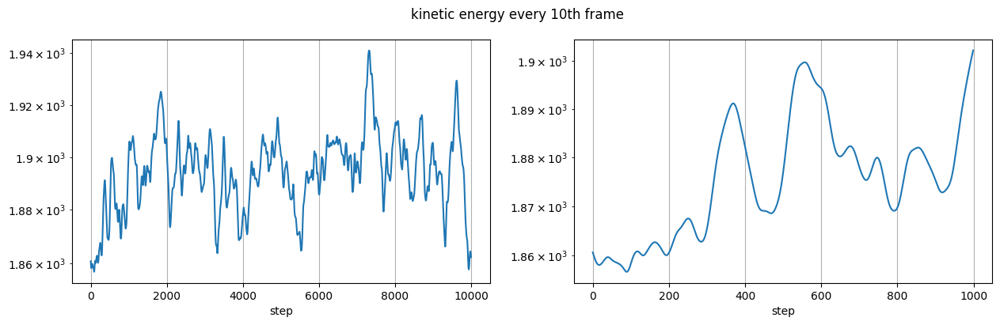

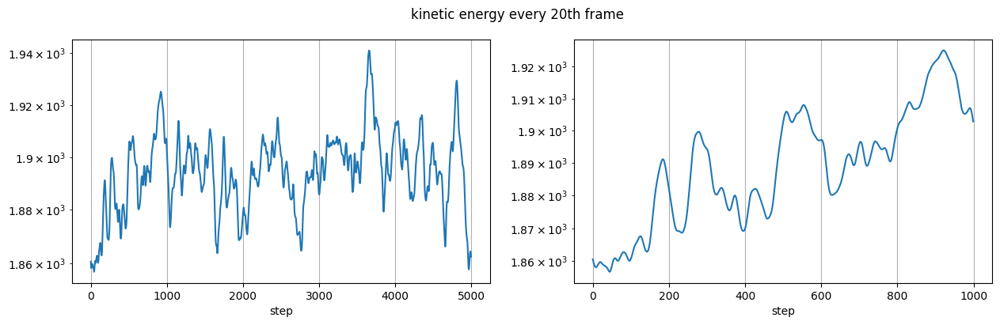

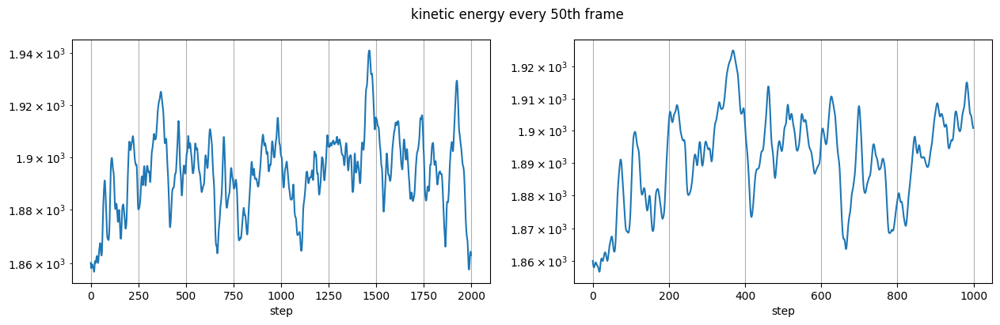

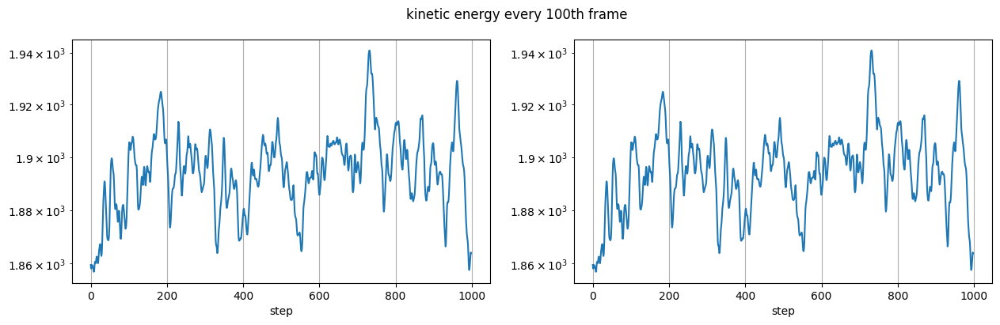

In [6]:
for i, every_n in enumerate(every_n_list):
    positions, vels_, accs_, metadata = props[i]

    # Ekin
    fig, ax = plt.subplots(1, 2, figsize=(15, 4))
    ekin = np.sum(np.square(vels_), axis=(0, 2))
    plt.suptitle(f"kinetic energy every {every_n}th frame")
    ax[0].plot(ekin)
    ax[0].set_yscale("log")
    ax[0].grid()
    ax[1].plot(ekin[:1000])
    ax[1].set_yscale("log")
    ax[0].set_xlabel("step")
    ax[1].set_xlabel("step")
    ax[1].grid()

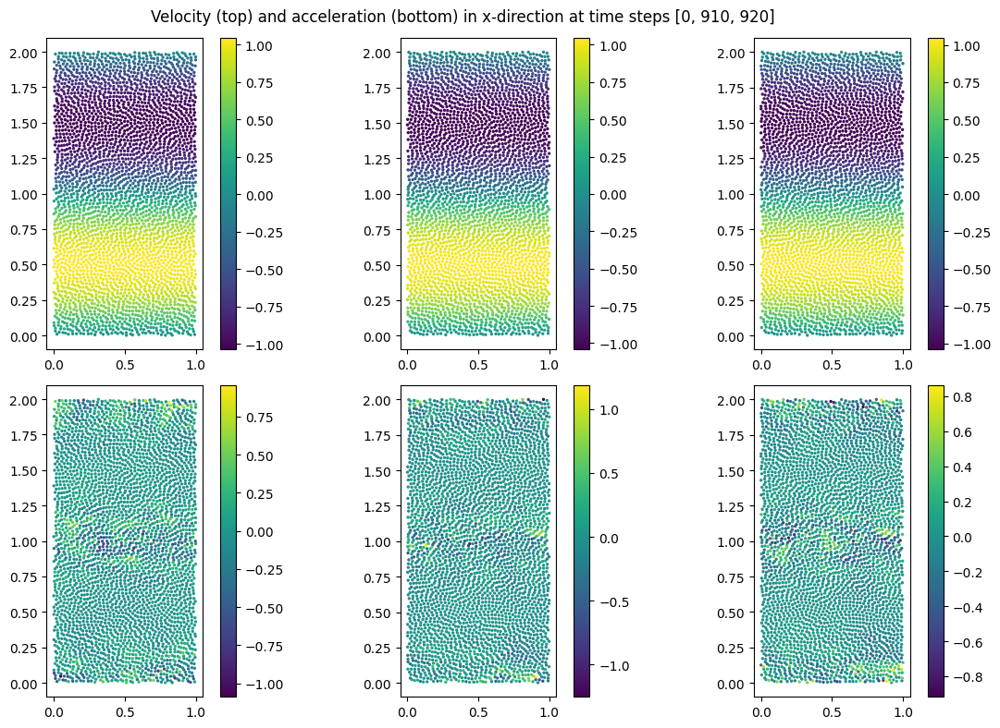

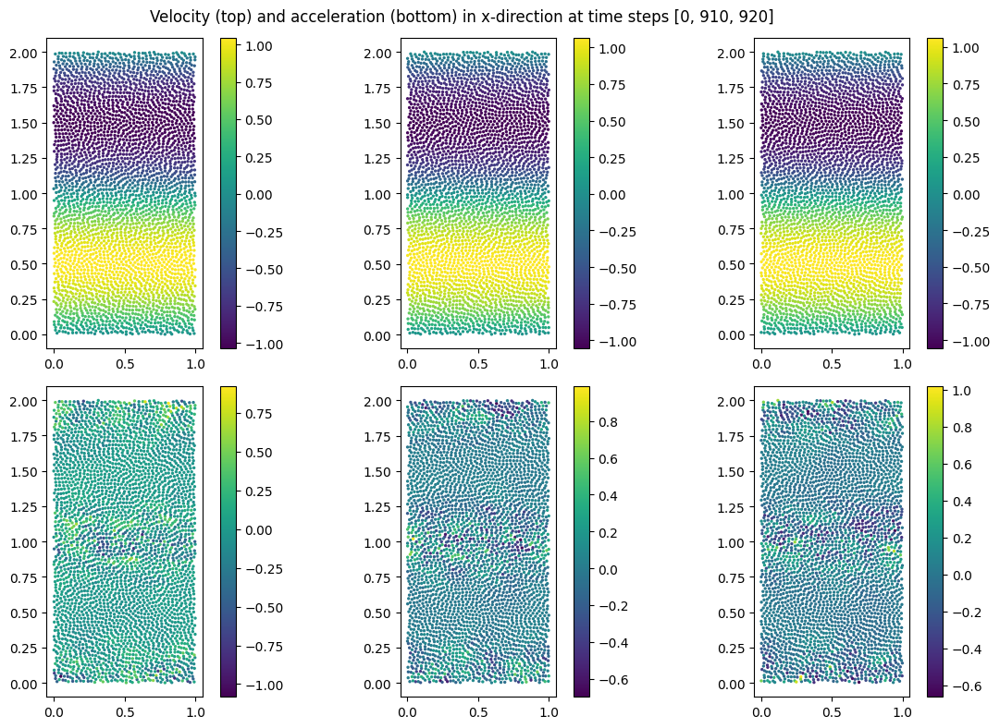

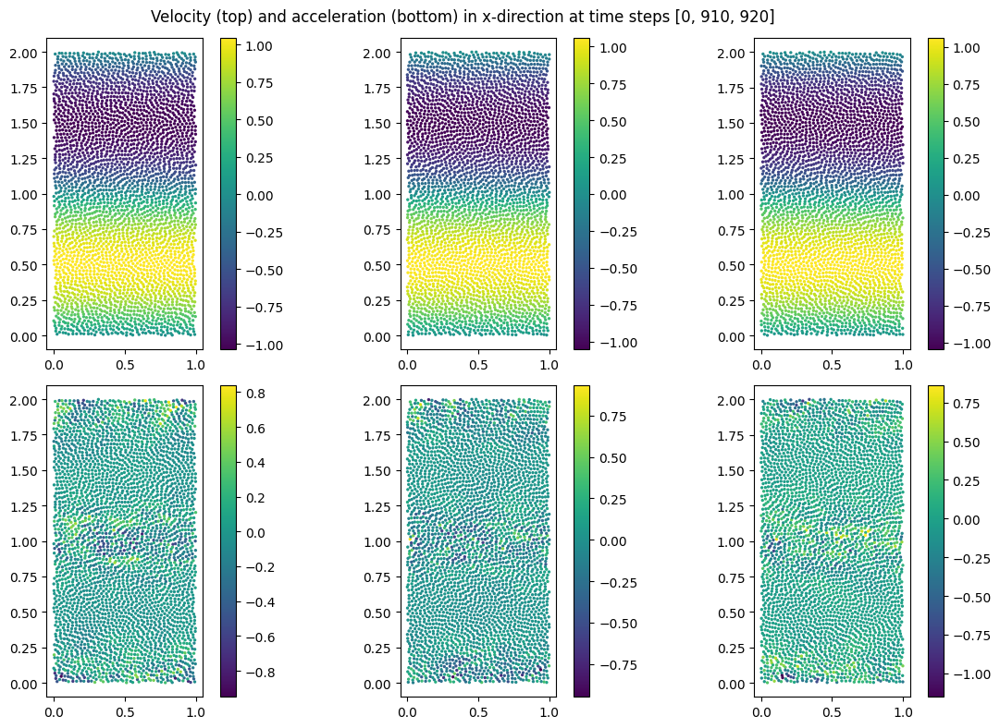

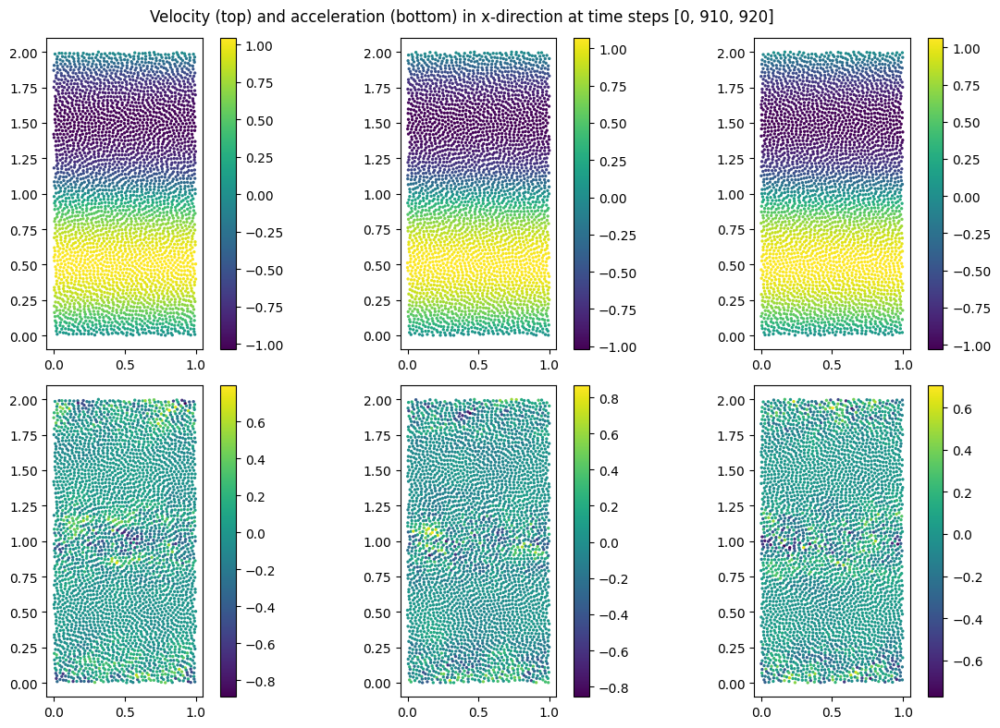

In [7]:
# velocity and acceleration in x-direction at different time steps
for i, every_n in enumerate(every_n_list):
    positions, vels_, accs_, metadata = props[i]

    fig, ax = plt.subplots(2, 3, figsize=(12, 8))
    steps_list = [0, 910, 920]
    for i, time in enumerate(steps_list):
        img = ax[0, i].scatter(positions[:, time+1, 0], positions[:, time+1, 1], c=vels_[:, time, 0], s=2)
        fig.colorbar(img)
        ax[0,i].set_aspect('equal')
        img = ax[1, i].scatter(positions[:, time+1, 0], positions[:, time+1, 1], c=accs_[:, time, 0], s=2)
        fig.colorbar(img)
        ax[1,i].set_aspect('equal')

    plt.suptitle(f"Velocity (top) and acceleration (bottom) in x-direction at time steps {steps_list}")
    plt.tight_layout()
    plt.show()

## 2D LDC

In [12]:
# h5 files

every_n_list = [10, 20, 30, 40, 50, 100]
split_into_ns = [1923, 961, 641, 480, 384, 192]
for i, every_n in enumerate(every_n_list):
    data_dir = f'/home/atoshev/data/2D_LDC_2500_10kevery{str(every_n)}'
    file_path = data_dir + '/valid.h5'

    with h5py.File(file_path, "r") as f:
        traj_keys = list(f.keys())

        sequence_shape = f["00000/position"].shape
        print(f'every {every_n}th frame has {traj_keys} keys and shape {sequence_shape}')
        
    data_valid = H5Dataset('valid', data_dir, split_valid_traj_into_n=split_into_ns[i], is_rollout=True)
    sample_valid = data_valid[0]
    print(f'every {every_n}th frame has {len(data_valid)} samples and shape {sample_valid[0].shape}')


every 10th frame has ['00000'] keys and shape (50006, 2708, 2)
every 10th frame has 1923 samples and shape (2708, 26, 2)
every 20th frame has ['00000'] keys and shape (25003, 2708, 2)
every 20th frame has 961 samples and shape (2708, 26, 2)
every 30th frame has ['00000'] keys and shape (16669, 2708, 2)
every 30th frame has 641 samples and shape (2708, 26, 2)
every 40th frame has ['00000'] keys and shape (12502, 2708, 2)
every 40th frame has 480 samples and shape (2708, 26, 2)
every 50th frame has ['00000'] keys and shape (10002, 2708, 2)
every 50th frame has 384 samples and shape (2708, 26, 2)
every 100th frame has ['00000'] keys and shape (5001, 2708, 2)
every 100th frame has 192 samples and shape (2708, 26, 2)


In [11]:
# into how many pieces to split the validation/testing set
print(np.array(np.array([50000, 25000, 16666, 12500, 10000, 5000])/26, dtype=int))
print(np.array(np.array([100000, 50000, 33333, 25000, 20000, 10000])/26, dtype=int))

[1923  961  641  480  384  192]
[3846 1923 1282  961  769  384]


In [5]:
# to get rollouts of 1000 SPH steps we need to split the validation into
valid_lengths = np.array([50000, 25000, 16666, 12500, 10000, 5000])
valid_splits = np.array([100, 50, 33, 25, 20, 10]) + 6
print(np.array(valid_lengths / valid_splits, dtype=int))

[471 446 427 403 384 312]


In [25]:
def get_seq(data_dir, split_into_n=10):
    data_train = H5Dataset('train', data_dir, split_valid_traj_into_n=split_into_n, is_rollout=True)
    displacement_fn, _ = space.periodic(side=np.array(data_train.metadata["bounds"])[:,1])
    with open(os.path.join(data_dir, "metadata.json"), "r") as f:
        metadata = json.loads(f.read())

    positions = data_train[0][0]
    print("positions.shape =", positions.shape)

    displ_vmap = vmap(displacement_fn, (0, 0))
    displ_dvmap = vmap(displ_vmap, (0, 0))

    print(f'shapes: {positions[:, 1:].shape}, {positions[:, :-1].shape}')
    dt = metadata["dt"] * int(data_dir.split('kevery')[1])
    vels_ = (displ_dvmap(positions[:, 1:], positions[:, :-1]))/dt
    accs_ = (vels_[:, 1:] - vels_[:, :-1])/dt
    print("vels.shape =", vels_.shape)
    print("accs.shape =", accs_.shape)
    
    print(f'Train set length = {len(data_train)}')
    a = next(iter(data_train))
    print(f'Shape of input instance = {a[0].shape}')
    particle_type = a[1]
    
    return positions, vels_, accs_, metadata, particle_type

props = []
for every_n, split_into in zip(every_n_list, split_into_ns):
    out = get_seq(f'/home/atoshev/data/2D_LDC_2500_10kevery{str(every_n)}', split_into_n=split_into)
    props.append(out)
# positions, vels_, accs_, metadata = get_seq("/home/atoshev/data/2D_RPF_3200_10kevery10", 10)

positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)
vels.shape = (2708, 51, 2)
accs.shape = (2708, 50, 2)
Train set length = 1923
Shape of input instance = (2708, 52, 2)
positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)
vels.shape = (2708, 51, 2)
accs.shape = (2708, 50, 2)
Train set length = 961
Shape of input instance = (2708, 52, 2)
positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)
vels.shape = (2708, 51, 2)
accs.shape = (2708, 50, 2)
Train set length = 641
Shape of input instance = (2708, 52, 2)
positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)
vels.shape = (2708, 51, 2)
accs.shape = (2708, 50, 2)
Train set length = 480
Shape of input instance = (2708, 52, 2)
positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)
vels.shape = (2708, 51, 2)
accs.shape = (2708, 50, 2)
Train set length = 384
Shape of input instance = (2708, 52, 2)
positions.shape = (2708, 52, 2)
shapes: (2708, 51, 2), (2708, 51, 2)


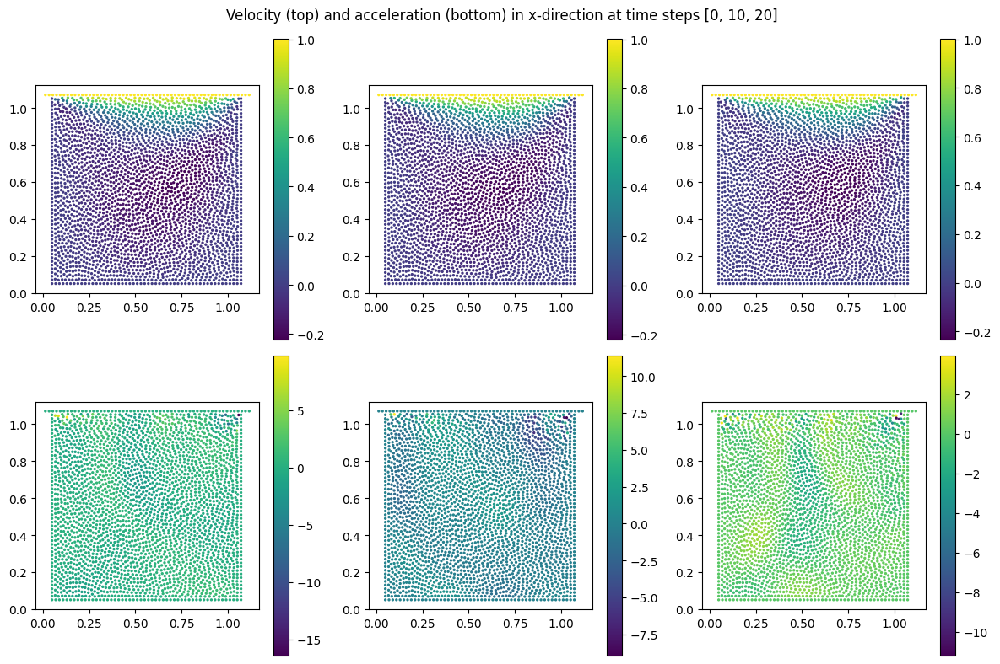

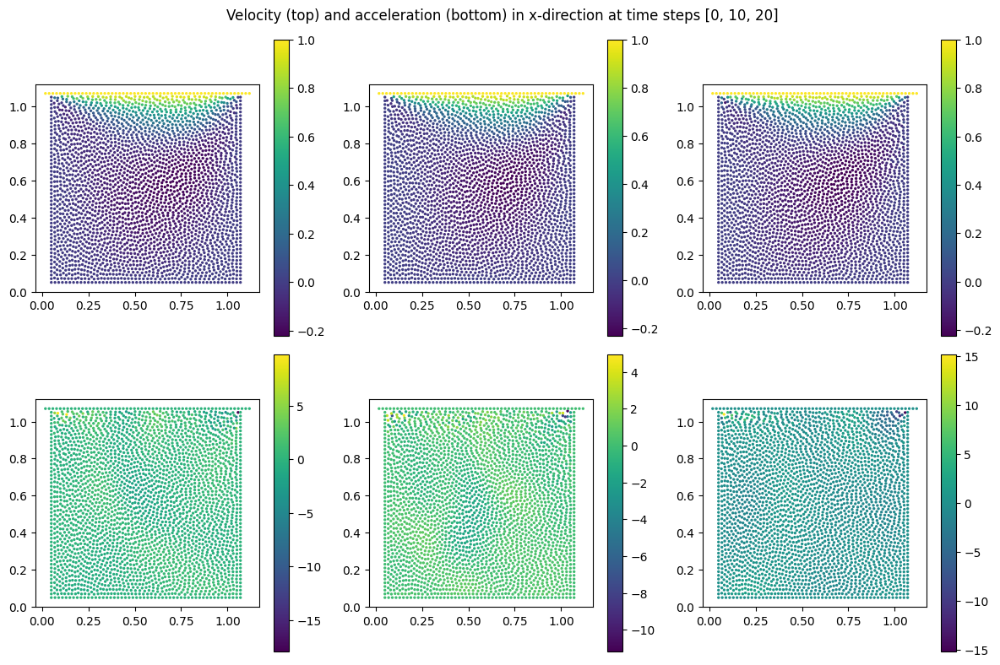

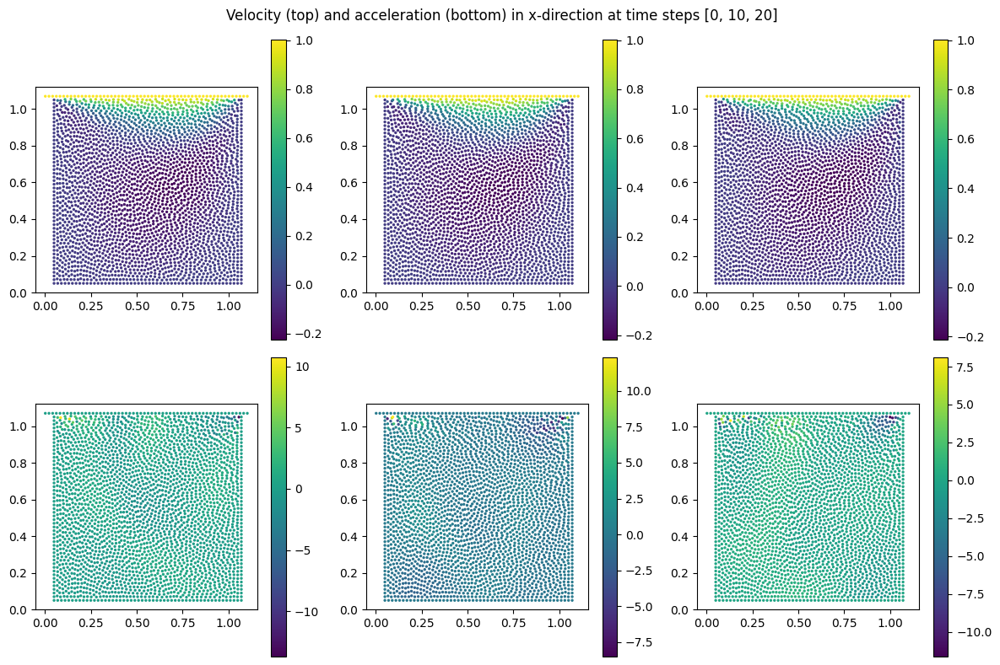

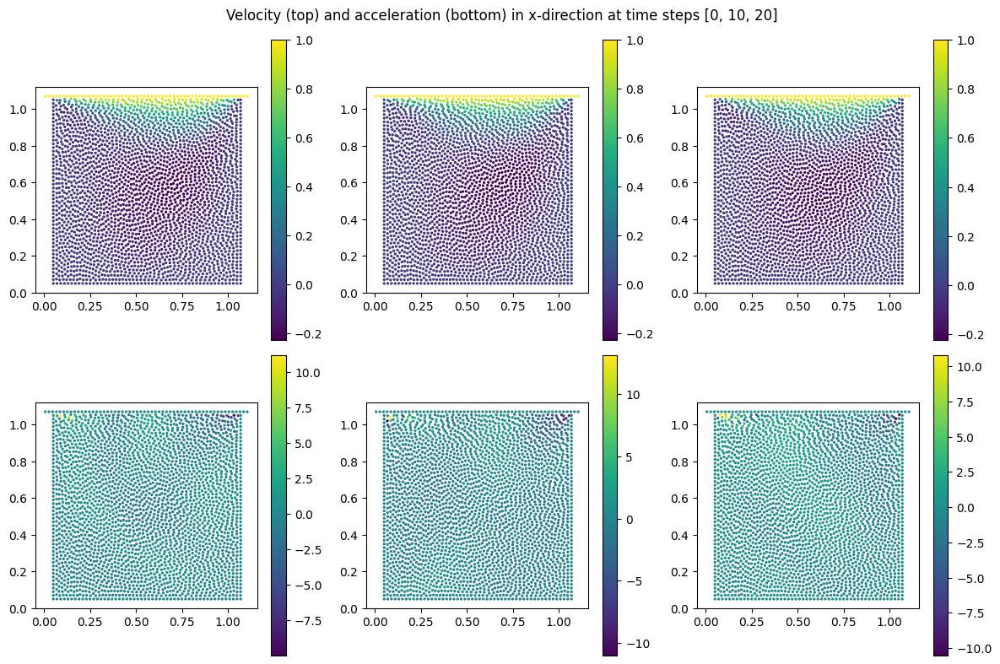

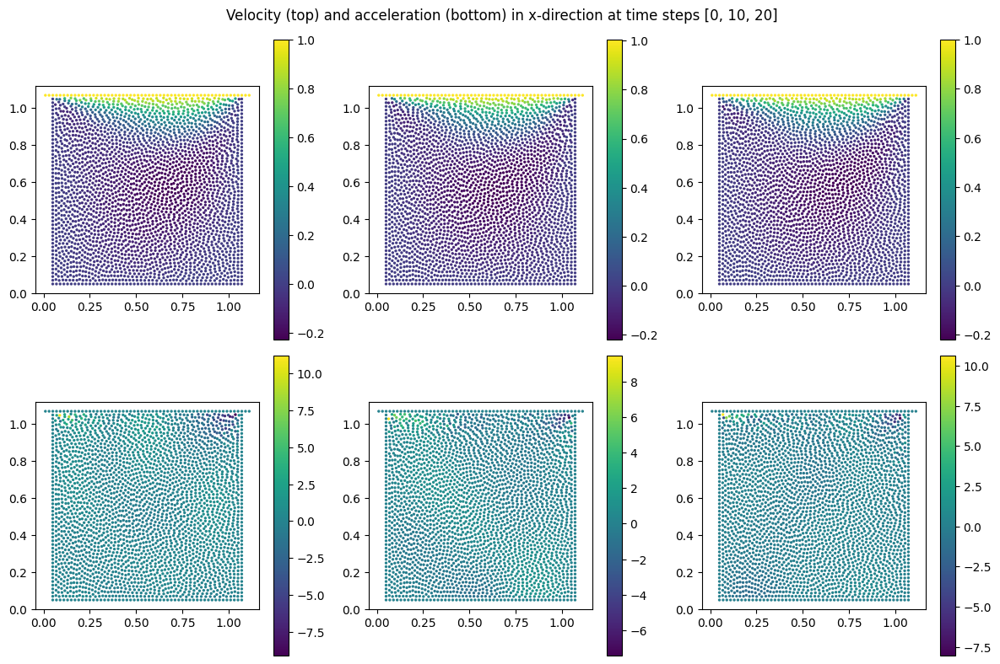

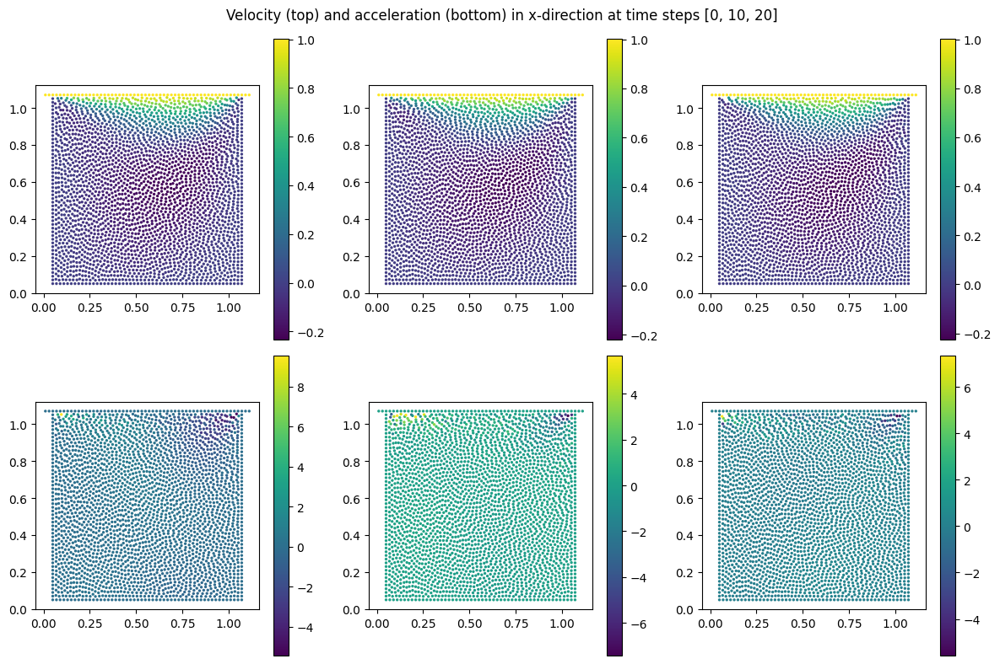

In [27]:
# velocity and acceleration in x-direction at different time steps
for i, every_n in enumerate(every_n_list):
    positions, vels_, accs_, metadata, particle_type = props[i]

    fig, ax = plt.subplots(2, 3, figsize=(12, 8))
    steps_list = [0, 10, 20]
    for i, time in enumerate(steps_list):
        img = ax[0, i].scatter(positions[:, time+1, 0], positions[:, time+1, 1], c=vels_[:, time, 0], s=2)
        fig.colorbar(img)
        ax[0,i].set_aspect('equal')
        img = ax[1, i].scatter(positions[:, time+1, 0], positions[:, time+1, 1], c=accs_[:, time, 0], s=2)
        # img = ax[1, i].scatter(positions[:, time+1, 0], positions[:, time+1, 1], c=particle_type, s=2)
        fig.colorbar(img)
        ax[1,i].set_aspect('equal')

    plt.suptitle(f"Velocity (top) and acceleration (bottom) in x-direction at time steps {steps_list}")
    plt.tight_layout()
    plt.show()